In [1]:
from echolab2.instruments import EK80, EK60
from echolab2.plotting.matplotlib import echogram

import numpy as np
import xarray as xr
from matplotlib import pyplot as plt, ticker
from matplotlib.colors import LinearSegmentedColormap, Colormap
from matplotlib.pyplot import figure, show, subplots_adjust, get_cmap

import zarr
import os.path

In [2]:
# Prepare simrad cmap
simrad_color_table = [(1, 1, 1),
                                    (0.6235, 0.6235, 0.6235),
                                    (0.3725, 0.3725, 0.3725),
                                    (0, 0, 1),
                                    (0, 0, 0.5),
                                    (0, 0.7490, 0),
                                    (0, 0.5, 0),
                                    (1, 1, 0),
                                    (1, 0.5, 0),
                                    (1, 0, 0.7490),
                                    (1, 0, 0),
                                    (0.6509, 0.3255, 0.2353),
                                    (0.4705, 0.2353, 0.1568)]
simrad_cmap = (LinearSegmentedColormap.from_list
                             ('Simrad', simrad_color_table))
simrad_cmap.set_bad(color='grey')


In [3]:


dir = os.path.expanduser("~/IMR/echo-test/hackathon/")

files = ['CRIMAC_2020_EK80_CW_DemoFile_GOSars.raw',
'CRIMAC_2020_EK80_FM_DemoFile_GOSars.raw',
'2017843-D20170426-T115044.raw']

#ek60 = EK60.EK60()
#ek80_FM = EK80.EK80()
ek80_CW = EK80.EK80()

ek80_CW.read_raw(dir + files[0])
#ek80_FM.read_raw(dir + files[1])
#ek60.read_raw(dir + files[2])



In [4]:
# Select a EK80 file
raw_obj = ek80_CW

#da_empty = xr.DataArray(name="sv", data=np.float32(0.0), dims=['frequency', 'ping_time', 'range'], coords=[[np.float32(0.0)], [np.datetime64('NaT')], [np.float32(0.0)]])

da_set = False

for chan in list(raw_obj.raw_data.keys()):
    # Getting raw data for a frequency
    raw_data = raw_obj.raw_data[chan][0]
    # Get calibration object
    cal_obj = raw_data.get_calibration()
    # Get sv values
    sv_obj = raw_data.get_sv(calibration = cal_obj)

    # Get frequency label
    freq = raw_data.frequency[0]

    # Expand sv values into a 3d object
    data3d = np.expand_dims(sv_obj.data, axis=0)

    # This is the sv data in 3d    
    da_sv = xr.DataArray(name="sv", data=data3d, dims=['frequency', 'ping_time', 'range'],
                           coords={ 'frequency': [freq],
                                    'ping_time': sv_obj.ping_time,
                                    'range': sv_obj.range,
                                   })

    # Create mask (for rapid nan filter later)
    ping_mask = xr.DataArray(name="ping_mask", data=True, dims=['frequency', 'ping_time'],
                           coords={ 'frequency': [freq],
                                    'ping_time': sv_obj.ping_time,
                                   })
    range_mask = xr.DataArray(name="range_mask", data=True, dims=['frequency', 'range'],
                           coords={ 'frequency': [freq],
                                    'range': sv_obj.range,
                                   })

    # Combine frequencies if not the first loop iteraton
    if da_set:
        da = xr.concat([da, da_sv], dim='frequency')
        da_ping_mask = xr.concat([da_ping_mask, ping_mask], dim='frequency')
        da_range_mask = xr.concat([da_range_mask, range_mask], dim='frequency')
    else:        
        da = da_sv
        da_ping_mask = ping_mask
        da_range_mask = range_mask
        da_set = True

In [5]:
# Convert the masks as boolean
da_ping_mask = da_ping_mask.fillna(0).astype(bool)
da_range_mask = da_range_mask.fillna(0).astype(bool)

In [6]:
# Filtering one frequency back to the raw sv
da_sub_ping_mask = da_ping_mask.loc["1.8e+04"]
da_sub_range_mask = da_range_mask.loc["1.8e+04"]
da_sub = da.loc["1.8e+04"][da_sub_ping_mask, da_sub_range_mask]

In [7]:
da_sub

<xarray.DataArray 'sv' (ping_time: 148, range: 24213)>
array([[7.68637411e-03, 3.18761295e-02, 1.06834220e-01, ...,
        4.70313970e-09, 6.64399395e-09, 7.92911240e-09],
       [7.92612895e-03, 3.25973957e-02, 1.09218401e-01, ...,
        8.48141877e-11, 7.02149801e-11, 4.38530231e-10],
       [7.97619734e-03, 3.27927151e-02, 1.09014634e-01, ...,
        2.76019341e-10, 4.21455393e-10, 8.47167100e-10],
       ...,
       [7.73112763e-03, 3.17692622e-02, 1.06819409e-01, ...,
        9.97179582e-10, 8.48100452e-10, 7.96183008e-10],
       [7.64917278e-03, 3.18284271e-02, 1.07220589e-01, ...,
        2.53476953e-10, 3.25960982e-10, 4.99653754e-10],
       [8.50836706e-03, 3.46873045e-02, 1.15292702e-01, ...,
        4.73712021e-10, 5.84163958e-10, 6.43543951e-10]])
Coordinates:
  * range      (range) float64 0.0 0.02065 0.0413 0.06195 ... 499.9 500.0 500.0
    frequency  float64 1.8e+04
  * ping_time  (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 2020...

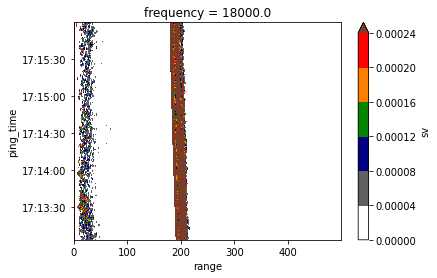

In [8]:
da_sub.plot.contourf(robust = True, cmap=simrad_cmap)

In [9]:
# Crate a dataset
ds = xr.Dataset(
    data_vars=dict(
        sv=(["frequency", "ping_time", "range"], da),
        ping_mask=(["frequency", "ping_time"], da_ping_mask),
        range_mask=(["frequency", "range"], da_range_mask),
        ),
    coords=dict(
        frequency = da.frequency,
        ping_time = da.ping_time,
        range = da.range,
        ),
    attrs=dict(description="Multi-frequency sv values from EK."),
)


In [10]:
ds

<xarray.Dataset>
Dimensions:     (frequency: 6, ping_time: 148, range: 68842)
Coordinates:
  * frequency   (frequency) float64 1.8e+04 3.8e+04 7e+04 1.2e+05 2e+05 3.33e+05
  * ping_time   (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 202...
  * range       (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
Data variables:
    sv          (frequency, ping_time, range) float64 0.007686 nan ... nan nan
    ping_mask   (frequency, ping_time) bool True True True ... True True True
    range_mask  (frequency, range) bool True False True ... False False False
Attributes:
    description:  Multi-frequency sv values from EK.

In [11]:
# Save into netcdf
comp = dict(zlib=True, complevel=5)
encoding = {var: comp for var in ds.data_vars}
ds.to_netcdf("EK80_CW_sv_only.nc", encoding=encoding)

In [12]:
# Save into zarr
compressor = zarr.Blosc(cname="zstd", clevel=3, shuffle=2)
encoding = {var: {"compressor" : compressor} for var in ds.data_vars}
ds.to_zarr("EK80_CW_sv_only.zarr", encoding=encoding)

In [13]:
# Try to open them
ds_nc = xr.open_dataset("EK80_CW_sv_only.nc")
ds_zr = xr.open_zarr("EK80_CW_sv_only.zarr")

In [14]:
# Open NetCDF
ds_nc

<xarray.Dataset>
Dimensions:     (frequency: 6, ping_time: 148, range: 68842)
Coordinates:
  * frequency   (frequency) float64 1.8e+04 3.8e+04 7e+04 1.2e+05 2e+05 3.33e+05
  * ping_time   (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 202...
  * range       (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
Data variables:
    sv          (frequency, ping_time, range) float64 ...
    ping_mask   (frequency, ping_time) bool ...
    range_mask  (frequency, range) bool ...
Attributes:
    description:  Multi-frequency sv values from EK.

In [15]:
# Open Zarr
ds_zr

<xarray.Dataset>
Dimensions:     (frequency: 6, ping_time: 148, range: 68842)
Coordinates:
  * frequency   (frequency) float64 1.8e+04 3.8e+04 7e+04 1.2e+05 2e+05 3.33e+05
  * ping_time   (ping_time) datetime64[ns] 2020-11-21T17:13:03.494000 ... 202...
  * range       (range) float64 0.0 0.0177 0.02065 0.0236 ... 500.0 500.0 500.0
Data variables:
    ping_mask   (frequency, ping_time) bool dask.array<chunksize=(6, 148), meta=np.ndarray>
    range_mask  (frequency, range) bool dask.array<chunksize=(3, 68842), meta=np.ndarray>
    sv          (frequency, ping_time, range) float64 dask.array<chunksize=(1, 19, 8606), meta=np.ndarray>
Attributes:
    description:  Multi-frequency sv values from EK.